In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')


pd.set_option('display.max_rows',10000)
pd.set_option('display.max_columns',15)
pd.set_option('display.width',10000)

In [2]:
dataset = pd.read_csv('Churn_Modelling.csv')

In [3]:
dataset.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [4]:
dataset.isnull().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [5]:
# No missing values present

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [7]:
# Exited is dependent and rest are independent variables

In [8]:
# Removing insignificant variables (Prepruning Method)

# RowNumber, CustomerId, Surname are insignificant variables

dataset = dataset.iloc[:,3:]
dataset.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [9]:
# Doing Label Encoding / One Hot Encoding

In [10]:
dataset['Geography'].value_counts()

France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64

In [11]:
dataset.Gender.value_counts()

Male      5457
Female    4543
Name: Gender, dtype: int64

In [12]:
dataset['Gender'] = dataset['Gender'].astype('category')
dataset['Gender'] = dataset['Gender'].cat.codes

In [13]:
dataset = pd.get_dummies(dataset, columns=['Geography'])

In [14]:
dataset.head()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain
0,619,0,42,2,0.00,1,1,1,101348.88,1,1,0,0
1,608,0,41,1,83807.86,1,0,1,112542.58,0,0,0,1
2,502,0,42,8,159660.80,3,1,0,113931.57,1,1,0,0
3,699,0,39,1,0.00,2,0,0,93826.63,0,1,0,0
4,850,0,43,2,125510.82,1,1,1,79084.10,0,0,0,1


In [15]:
dataset = dataset.drop(['Geography_France'], axis=1)

In [16]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CreditScore        10000 non-null  int64  
 1   Gender             10000 non-null  int8   
 2   Age                10000 non-null  int64  
 3   Tenure             10000 non-null  int64  
 4   Balance            10000 non-null  float64
 5   NumOfProducts      10000 non-null  int64  
 6   HasCrCard          10000 non-null  int64  
 7   IsActiveMember     10000 non-null  int64  
 8   EstimatedSalary    10000 non-null  float64
 9   Exited             10000 non-null  int64  
 10  Geography_Germany  10000 non-null  uint8  
 11  Geography_Spain    10000 non-null  uint8  
dtypes: float64(2), int64(7), int8(1), uint8(2)
memory usage: 732.5 KB


In [17]:
# Generally outliers handling is not required in Random Forest

In [18]:
for i in dataset.columns:
    print('********',i,'*******************')
    print()
    print(set(dataset[i].tolist()))
    print()

******** CreditScore *******************

{350, 351, 358, 359, 363, 365, 367, 373, 376, 382, 383, 386, 395, 399, 401, 404, 405, 407, 408, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 553, 554, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 58

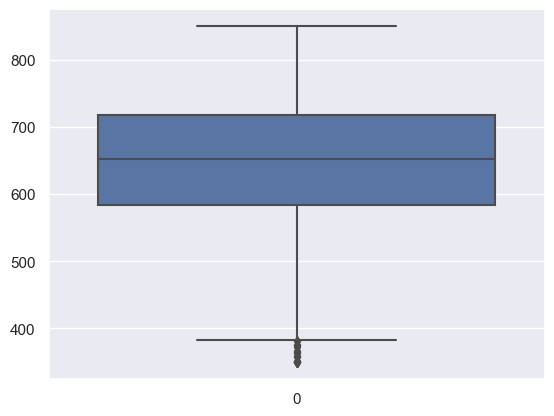

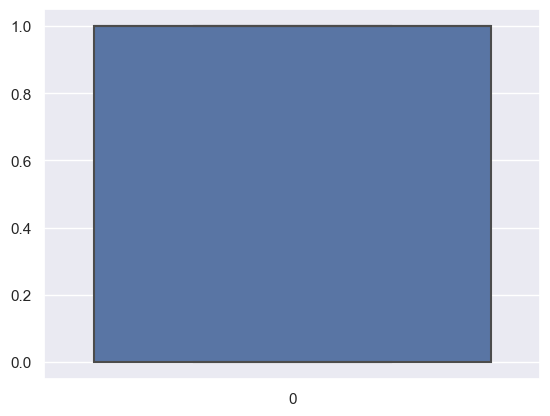

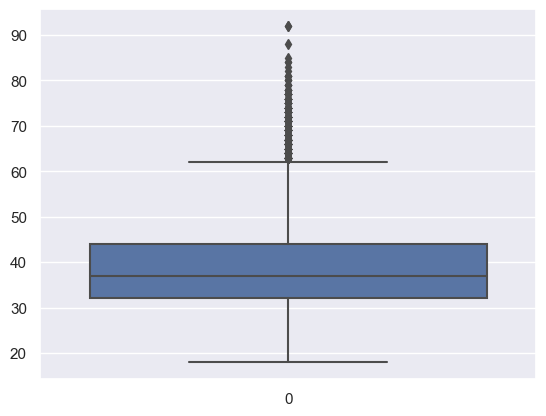

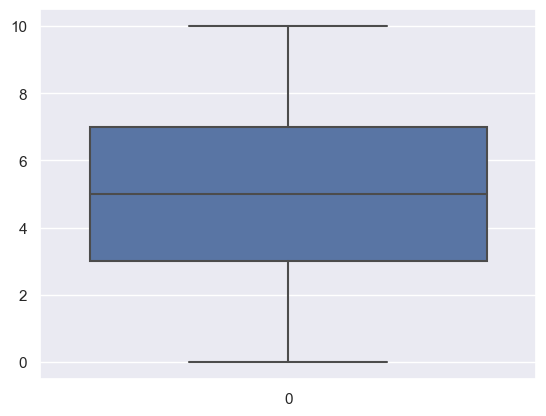

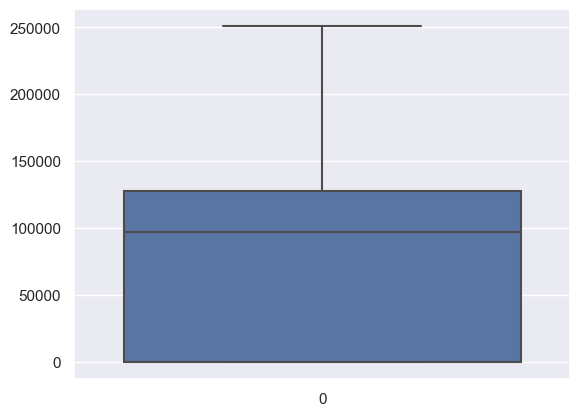

...

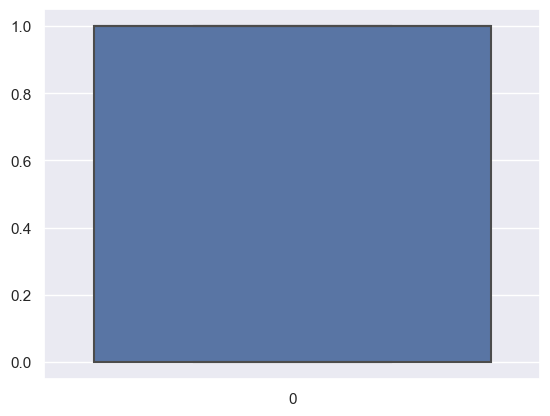

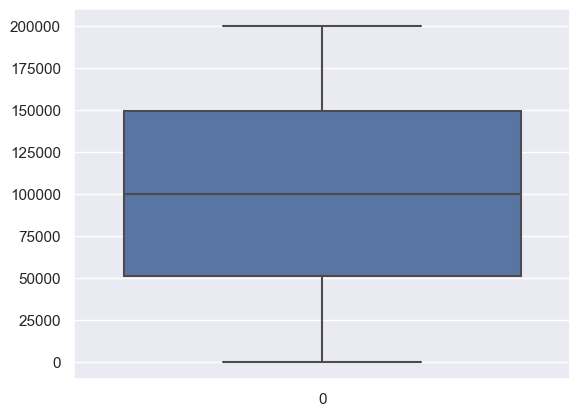

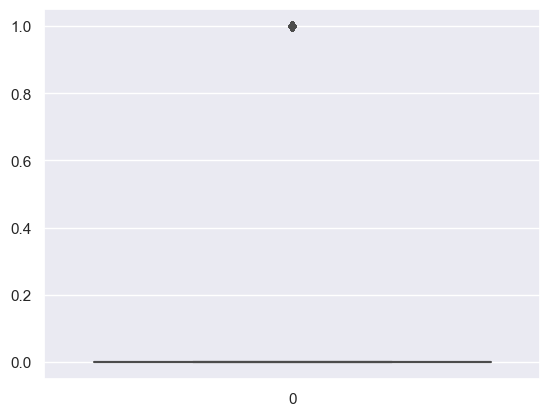

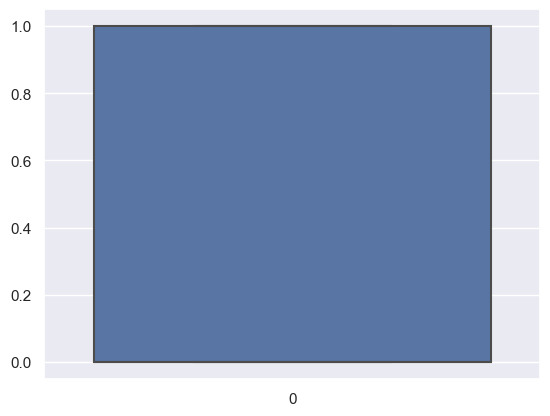

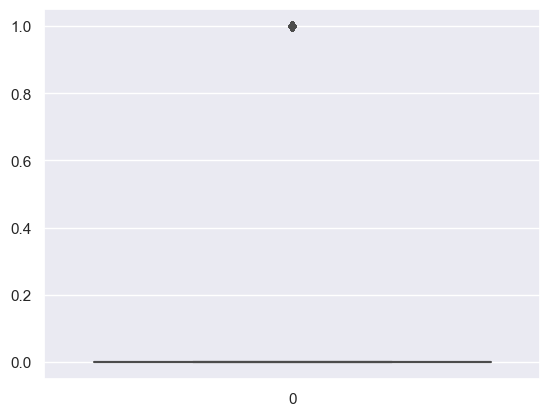

In [19]:
def boxplots(col):
    sns.boxplot(dataset[col])
    plt.show()
    
for i in list(dataset.select_dtypes(exclude=['object']).columns)[0:]:
    boxplots(i)

In [20]:
# Splitting the data into independent and dependent variable
x=dataset.drop(['Exited'], axis=1)
y=dataset[['Exited']]

In [21]:
x.head()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Geography_Germany,Geography_Spain
0,619,0,42,2,0.00,1,1,1,101348.88,0,0
1,608,0,41,1,83807.86,1,0,1,112542.58,0,1
2,502,0,42,8,159660.80,3,1,0,113931.57,0,0
3,699,0,39,1,0.00,2,0,0,93826.63,0,0
4,850,0,43,2,125510.82,1,1,1,79084.10,0,1


In [22]:
y.head()

,Exited
0,1
1,0
2,1
3,0
4,0


In [23]:
# Feature Scaling Required

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x1 = sc.fit_transform(x)
pd.DataFrame(x1).head()

,0,1,2,3,4,5,6,7,8,9,10
0,-0.326221,-1.095988,0.293517,-1.041760,-1.225848,-0.911583,0.646092,0.970243,0.021886,-0.578736,-0.573809
1,-0.440036,-1.095988,0.198164,-1.387538,0.117350,-0.911583,-1.547768,0.970243,0.216534,-0.578736,1.742740
2,-1.536794,-1.095988,0.293517,1.032908,1.333053,2.527057,0.646092,-1.030670,0.240687,-0.578736,-0.573809
3,0.501521,-1.095988,0.007457,-1.387538,-1.225848,0.807737,-1.547768,-1.030670,-0.108918,-0.578736,-0.573809
4,2.063884,-1.095988,0.388871,-1.041760,0.785728,-0.911583,0.646092,0.970243,-0.365276,-0.578736,1.742740


In [24]:
# Checking Imbalance Data

y.value_counts()

Exited
0         7963
1         2037
dtype: int64

In [25]:
# minority x 2 not greater than majority
# Hence data is imbalanced

In [26]:
import imblearn
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
x_sam, y_sam = ros.fit_resample(x1,y)
print(x_sam.shape, y_sam.shape, y.shape)

(15926, 11) (15926, 1) (10000, 1)


In [27]:
# Data increased from 10000 to 15926

In [28]:
y_sam.value_counts()

Exited
0         7963
1         7963
dtype: int64

In [29]:
# Now data is balanced

In [30]:
dataset.corr()

,CreditScore,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain
CreditScore,1.000000,-0.002857,-0.003965,0.000842,0.006268,0.012238,-0.005458,0.025651,-0.001384,-0.027094,0.005538,0.004780
Gender,-0.002857,1.000000,-0.027544,0.014733,0.012087,-0.021859,0.005766,0.022544,-0.008112,-0.106512,-0.024628,0.016889
Age,-0.003965,-0.027544,1.000000,-0.009997,0.028308,-0.030680,-0.011721,0.085472,-0.007201,0.285323,0.046897,-0.001685
Tenure,0.000842,0.014733,-0.009997,1.000000,-0.012254,0.013444,0.022583,-0.028362,0.007784,-0.014001,-0.000567,0.003868
Balance,0.006268,0.012087,0.028308,-0.012254,1.000000,-0.304180,-0.014858,-0.010084,0.012797,0.118533,0.401110,-0.134892
NumOfProducts,0.012238,-0.021859,-0.030680,0.013444,-0.304180,1.000000,0.003183,0.009612,0.014204,-0.047820,-0.010419,0.009039
HasCrCard,-0.005458,0.005766,-0.011721,0.022583,-0.014858,0.003183,1.000000,-0.011866,-0.009933,-0.007138,0.010577,-0.013480
IsActiveMember,0.025651,0.022544,0.085472,-0.028362,-0.010084,0.009612,-0.011866,1.000000,-0.011421,-0.156128,-0.020486,0.016732
EstimatedSalary,-0.001384,-0.008112,-0.007201,0.007784,0.012797,0.014204,-0.009933,-0.011421,1.000000,0.012097,0.010297,-0.006482
Exited,-0.027094,-0.106512,0.285323,-0.014001,0.118533,-0.047820,-0.007138,-0.156128,0.012097,1.000000,0.173488,-0.052667


<Axes: >

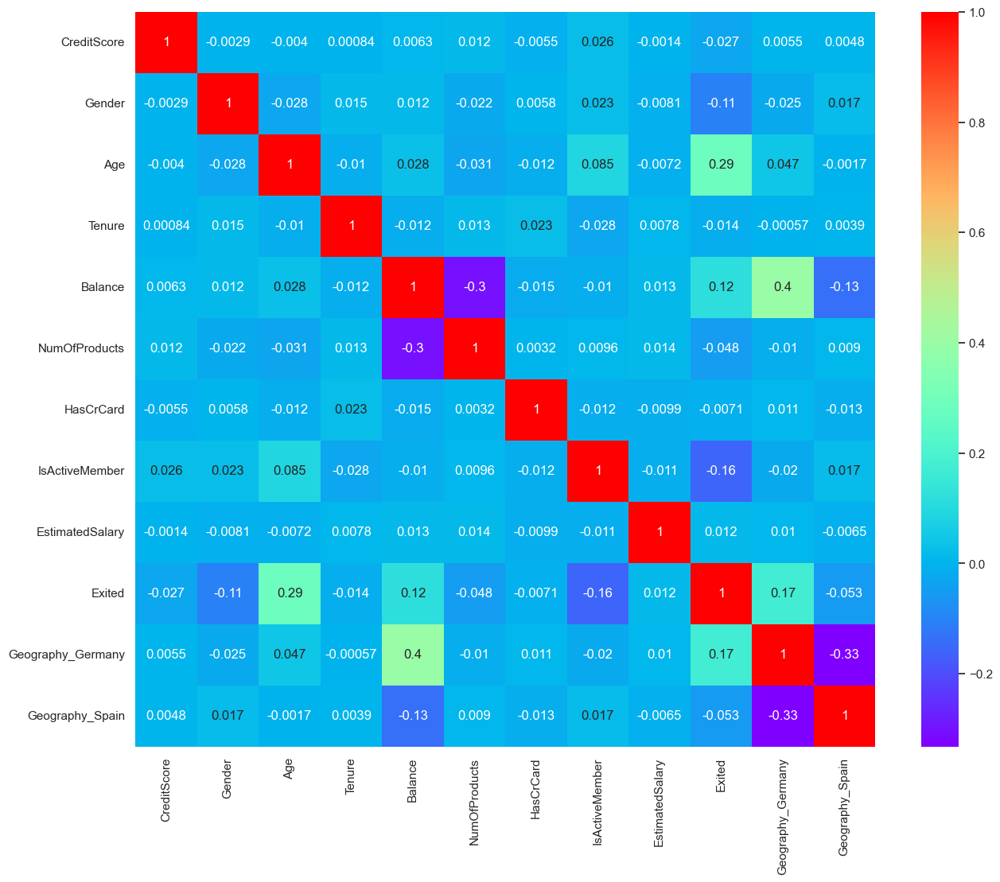

In [31]:
plt.figure (figsize=(15,12),dpi =100)
sns.heatmap(dataset.corr(), annot = True, cmap='rainbow')

In [32]:
# There is no problem of multi-collinearity

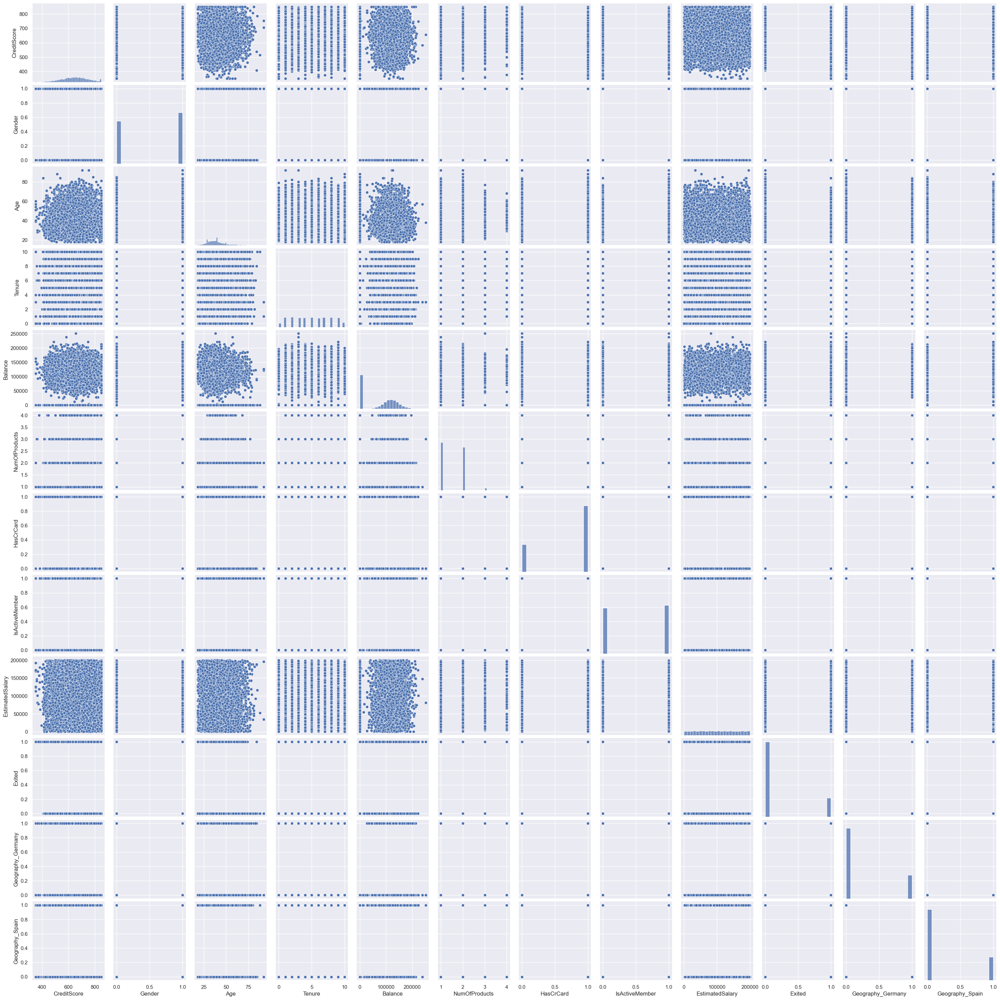

In [33]:
sns.pairplot(dataset)

<Axes: xlabel='Exited'>

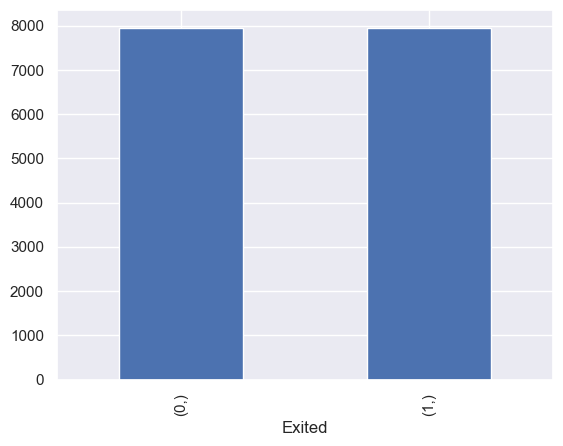

In [34]:
pd.DataFrame(y_sam).value_counts().plot(kind='bar')

<Axes: xlabel='Exited'>

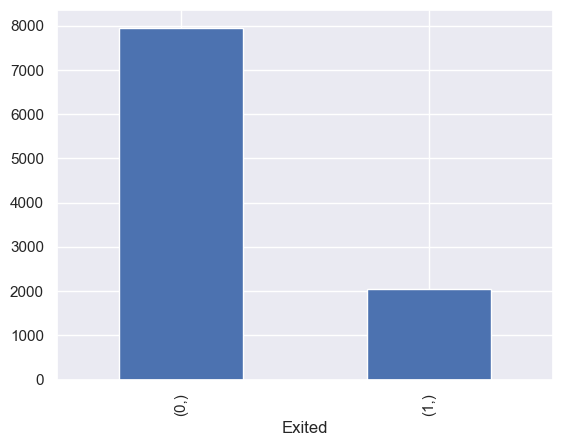

In [35]:
pd.DataFrame(y).value_counts().plot(kind='bar')

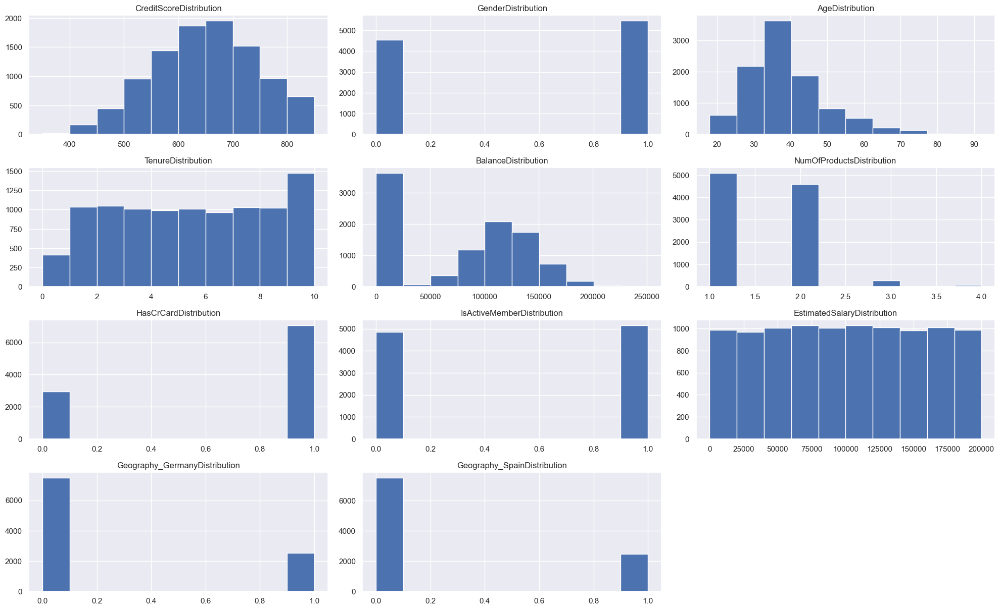

In [36]:
def histograms(dataset, variables, n_rows,n_cols):
    fig = plt.figure(figsize=(20,15))
    for i, var_name in enumerate(variables):
        ax= fig.add_subplot(n_rows,n_cols,i+1)
        dataset[var_name].hist(bins=10, ax=ax)
        ax.set_title(var_name +'Distribution')
    fig.tight_layout()
    plt.show()
    
histograms(dataset, x, 5, 3 )

In [37]:
# Advance EDA
#!pip install dtale

In [38]:
import dtale
import dtale.app as dtale_app

In [39]:
dtale.show(dataset)

In [40]:
# Split the data into training and testing

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_sam,y_sam,test_size=0.25,random_state=101,
                                                   stratify=y_sam)

# Mention stratify = dependent variable when there is imbalance data

# Building Model by Bagging Algorithm

In [41]:
from sklearn.ensemble import BaggingClassifier
bagging = BaggingClassifier()
bagging.fit(x_train, y_train)

BaggingClassifier()

In [42]:
# Predict

y_pred_train_bag = bagging.predict(x_train)
y_pred_test_bag = bagging.predict(x_test)

In [43]:
# Evaluate

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [44]:
print(confusion_matrix (y_train, y_pred_train_bag))
print()
print(confusion_matrix (y_test, y_pred_test_bag))

[[5956   16]
 [  21 5951]]

[[1788  203]
 [  73 1918]]


In [45]:
print(classification_report (y_train, y_pred_train_bag))
print()
print(classification_report (y_test, y_pred_test_bag))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5972
           1       1.00      1.00      1.00      5972

    accuracy                           1.00     11944
   macro avg       1.00      1.00      1.00     11944
weighted avg       1.00      1.00      1.00     11944


              precision    recall  f1-score   support

           0       0.96      0.90      0.93      1991
           1       0.90      0.96      0.93      1991

    accuracy                           0.93      3982
   macro avg       0.93      0.93      0.93      3982
weighted avg       0.93      0.93      0.93      3982



In [46]:
print(accuracy_score (y_train, y_pred_train_bag))
print()
print(accuracy_score (y_test, y_pred_test_bag))

0.9969022103148024

0.9306880964339528


# Building Model by Random Forest Method

In [47]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=200, criterion='entropy', bootstrap=True, oob_score=False)
rf.fit(x_train,y_train)

#n_estimators means no. of trees by default it is 100

RandomForestClassifier(criterion='entropy', n_estimators=200)

In [48]:
# Predict

y_pred_train_rf = rf.predict(x_train)
y_pred_test_rf = rf.predict(x_test)

In [49]:
print(confusion_matrix (y_train, y_pred_train_rf))
print()
print(confusion_matrix (y_test, y_pred_test_rf))

[[5972    0]
 [   0 5972]]

[[1821  170]
 [  32 1959]]


In [50]:
print(classification_report (y_train, y_pred_train_rf))
print()
print(classification_report (y_test, y_pred_test_rf))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5972
           1       1.00      1.00      1.00      5972

    accuracy                           1.00     11944
   macro avg       1.00      1.00      1.00     11944
weighted avg       1.00      1.00      1.00     11944


              precision    recall  f1-score   support

           0       0.98      0.91      0.95      1991
           1       0.92      0.98      0.95      1991

    accuracy                           0.95      3982
   macro avg       0.95      0.95      0.95      3982
weighted avg       0.95      0.95      0.95      3982



In [51]:
print(accuracy_score (y_train, y_pred_train_rf))
print()
print(accuracy_score (y_test, y_pred_test_rf))

1.0

0.9492717227523857


In [52]:
# Applying Cross Validation Approach in Random Forest (Should always be used in Random Forest)

In [53]:
from sklearn.model_selection import cross_val_score
accuracy = cross_val_score(rf, x_train, y_train, cv=10)
print('Training Accuracy :', accuracy.mean())

Training Accuracy : 0.938210228268259


In [54]:
print('Test Accuracy :', accuracy_score (y_test, y_pred_test_rf))

Test Accuracy : 0.9492717227523857


# HyperParameter Tuning

- Grid Search CV - 
    - Checks one by one on all parameters (prefered when less data), 
    - takes lot of time
- Random Search - 
    - It checks randomly on samples (Prefered when huge data), 
    - takes less time

In [55]:
RandomForestClassifier()

RandomForestClassifier()

In [56]:
n_estimators=[20,60,100,200,500]  
max_depth=[None,2,4,6,8]
max_features=['auto','sqrt','log2']
bootstrap=[True,False]
max_samples=[0.5,0.75,1.0,2.0]
min_samples_split=[2,4,8,10]
min_samples_leaf=[1,2,4]

In [58]:
param_grid = {'n_estimators':n_estimators,'max_depth':max_depth,'max_features':max_features,
             'bootstrap':bootstrap,'max_samples':max_samples,'min_samples_split':min_samples_split,
             'min_samples_leaf':min_samples_leaf}

print(param_grid)

{'n_estimators': [20, 60, 100, 200, 500], 'max_depth': [None, 2, 4, 6, 8], 'max_features': ['auto', 'sqrt', 'log2'], 'bootstrap': [True, False], 'max_samples': [0.5, 0.75, 1.0, 2.0], 'min_samples_split': [2, 4, 8, 10], 'min_samples_leaf': [1, 2, 4]}


In [59]:
from sklearn.model_selection import GridSearchCV
rf_grid = GridSearchCV(estimator = rf, param_grid=param_grid, cv=5,
                      n_jobs=-1, verbose=2)

# n_jobs means process are run parallely, cpu will go left to right
# verbose =1,2 gives complete analysis 0 means no output

In [60]:
# This process takes lot of time around 30-40 Minutes
# Use google collab for faster result

rf_grid.fit(x_train,y_train)

Fitting 5 folds for each of 7200 candidates, totalling 36000 fits


/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `ma

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   9.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=   4.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=  10.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   4.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=  11.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, ma

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   4.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   9.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


e=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  10.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time= 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  10.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  10.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   4.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   9.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   2.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   5.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=  11.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


timators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   4.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=  10.8s
[CV] END bootstrap=True, max_depth

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   2.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   4.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  13.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  10.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   5.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=  10.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   3.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   5.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estima

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


tors=500; total time=  10.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=  10.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


amples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   3.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   5.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  10.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  13.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=  11.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimat

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ors=60; total time=   1.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   4.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=  11.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   2.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   4.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   4.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  12.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, m

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   5.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  13.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   2.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   3.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   2.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   5.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   4.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, max_samples=1

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


t, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   2.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   7.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   3.6s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   4.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimat

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=  10.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=  11.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=  12.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=   9.7s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  10.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, ma

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   4.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   9.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, m

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s=200; total time=   4.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   9.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   9.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   9.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   3.7s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   9.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   7.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   7.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


; total time=  10.6s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  10.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   3.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   9.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   9.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   9.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s=100; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   9.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, ma

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   9.6s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  10.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  10.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  11.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=  10.5s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.3s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   5.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  10.6s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total t

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=  10.7s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   2.6s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   4.4s
[CV] END bootstrap=True, max_depth=None, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=  12.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   3.3s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   3.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   4.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   3.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   4.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon


[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  12.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  11.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=  12.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   4.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=  11.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   2.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   4.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_s

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, ma

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   4.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   5.1s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=500

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  12.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=  12.9s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   4.7s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=  12.9s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=log2, max_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

s_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s


/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_l

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   5.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ax_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


epth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   5.4s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_es

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_sa

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


rap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   4.3s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=1.0, min_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=4

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_es

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.8s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


les_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_lea

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.3s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

atures=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   5.7s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.4s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500;

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.9s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=1.0, min_sa

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_es

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   3.9s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


otstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   3.9s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=4, min

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   4.4s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_sam

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

tstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_lea

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   5.4s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   5.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.5, min_samples_le

te-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anac

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_sampl

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


h=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   7.9s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_esti

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

mators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_l

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   7.6s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_l

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   6.1s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.4s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   3.0s
[CV] END bootstrap=True, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


t, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=20; tot

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.3s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.4s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   4.3s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_lea

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ax_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.5s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   6.1s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.7s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.1s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


pth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   4.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   4.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_es

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_l

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_e

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   4.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


rap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.5s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

rue, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


ax_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.1s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.9s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.9s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.9s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samp

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


p=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_sp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   3.1s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=2.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   4.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   4.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   5.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.6s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimator

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   4.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   4.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   5.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END boots

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_dep

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.4s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   3.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.7s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6,

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   3.1s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=0.75, m

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


x_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   4.8s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   6.8s
[CV] END bootstrap=True, max_depth=6, max_features=sqrt, max_samples=1.0, min_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   4.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   5.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   4.8s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_sam

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


rap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_spl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_l

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   2.5s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   3.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=0.75, min_samples_leaf=4

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTre

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=4

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   6.4s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   5.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   5.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/si

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_sample

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


h=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estim

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   3.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   7.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


ples_leaf=1, min_samples_split=4, n_estimators=500; total time=   7.4s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   6.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   7.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.9s
[CV] END boots

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   3.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   6.6s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=0.75, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   1.2s
[CV] END bootstrap=True, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   6.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   5.5s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.9s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   3.5s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_sample

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, 

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_e

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   3.5s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   6.6s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_sample

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


pth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estim

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.6s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   7.2s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   7.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   3.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=0.75, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_spl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   8.0s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   7.3s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=8, n_estimators=60; total time=   0.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   6.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.5, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   1.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   6.5s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_sampl

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=1,

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


 max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_e

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

af=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_de

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

pth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estim

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.8s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   2.7s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   7.5s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.8s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=0.75, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

es=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=50

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max

[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   8.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   2.9s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   9.8s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.4s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   1.5s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_le

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

af=4, min_samples_split=10, n_estimators=100; total time=   2.6s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   4.3s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   4.2s
[CV] END bootstrap=True, max_depth=8, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=  10.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bo

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=aut

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

o, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split

l().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-package

[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_sa

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

mples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_sampl

lumn-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), fo

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

t, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, 

ning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_sam

, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstra

[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_s

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=sqrt, ma

a3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A co

[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_s

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_est

y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_val

x_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_l

ackages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed

10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=F

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

it=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=Fa

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

les=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=None, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; t

model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array

[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_l

 for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

in_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


s_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END b

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; 

ages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed wh

[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_sam

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=auto, max_samples=2.0, min_sam

learn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_sam

ples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anacond

ples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END boo

imator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/

=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=0.75, min_samples_

e change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, *

max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total 

samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anac

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_sample

-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for ex

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

ples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END boot

r.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model

[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, 

[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=0.75, mi

or y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example

[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_s

timator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

ples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=1.0, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=2, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END boot

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

eaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap

[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.5, m

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, 

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=0.75, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

in_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END boo

a3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A co

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=auto, max_samples=2.0, min_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

 total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_

a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  est

plit=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_f

he shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_param

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

ples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bo

[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=

imator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/

mples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s

s)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: Data

 max_depth=4, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_

avel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-pack

[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=sqrt, max_samples=2.0, m

ion.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please ch

in_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, ma

: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the s

[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=0.75, min_samp

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

s=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=1.0, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

ples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END boots

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=4, max_features=log2, max_samples=2.0, min_sam

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.5, min_samples_

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

tstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=0.75, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_sam

imator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=auto, max_samples=2.0, min_sam

validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Pl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples

as passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using

es=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total ti

[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.5, min_sampl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, 

 to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sum

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=1.0, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=0.75, min_samples_leaf=2, min_samples_split=8, n_estimators=500; total time=   

ray was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.

[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_

: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_sam

 y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example u

in_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=0.5, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=Fa

[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samp

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=1.0, min_samples

 to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sum

[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_sam

lumn-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), fo

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

ples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=2, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bo

[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=6, max_features=log2, max_samples=2.0, min_s

ease change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train

ples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.5, min_samples_leaf=4, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bo

g ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-p

_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=0.75, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.0s
[

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

ples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   0.0s
[CV] END bo

[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=1.0, min_samples_

  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/skl

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_leaf=2, min_samples_split=4, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=auto, max_samples=2.0, min_samples_

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

in_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=2, min_samples_split=2, n_estimators=20; total time=   0.0s
[CV] E

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_leaf=4, min_samples_split=8, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.5, min_samples_l

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

x_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=8, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=0.75, min_samples_leaf=1, min_samp

[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples_leaf=4, min_samples_split=8, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=1.0, min_samples

e the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_pa

 min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   0.0s
[CV

-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for ex

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataCon

[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=sqrt, max_samples=2.0, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=4, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_

s/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversi

   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.7

or y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/Sumit/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example

ples_leaf=1, min_samples_split=10, n_estimators=20; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.5, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=   0.0s
[CV] END b

[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=60; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END bootstrap=False, max_depth=8, max_features=log2, max_samples=0.75, m

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(criterion='entropy',
                                              n_estimators=200),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 2, 4, 6, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'max_samples': [0.5, 0.75, 1.0, 2.0],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 4, 8, 10],
                         'n_estimators': [20, 60, 100, 200, 500]},
             verbose=2)

In [61]:
rf_grid.best_params_

{'bootstrap': True,
 'max_depth': None,
 'max_features': 'log2',
 'max_samples': 1.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 60}

In [62]:
rf_grid.best_score_

0.9305084442724295

In [ ]:
# Random SearchCV

from sklearn.model_selection import RandomizedSearchCV
